# EfficientNetV2 gender prediction

In [1]:
import pandas as pd
import torch

In [2]:
# Load the data
df = pd.read_csv('./faces/fold_0_data.txt', sep="\t")

In [3]:
print(df.shape)
print(df.columns)
df.head()

(4484, 12)
Index(['user_id', 'original_image', 'face_id', 'age', 'gender', 'x', 'y', 'dx',
       'dy', 'tilt_ang', 'fiducial_yaw_angle', 'fiducial_score'],
      dtype='object')


,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,"(25, 32)",f,0,414,1086,1383,-115,30,17
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,"(25, 32)",f,2395,876,771,771,175,-30,74
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34


In [4]:
# Load the other dataframes
df1 = pd.read_csv('./faces/fold_1_data.txt', sep="\t")
df2 = pd.read_csv('./faces/fold_2_data.txt', sep="\t")
df3 = pd.read_csv('./faces/fold_3_data.txt', sep="\t")
df4 = pd.read_csv('./faces/fold_4_data.txt', sep="\t")

# Concatenate all the dataframes
df = pd.concat([df, df1, df2, df3, df4]).reset_index(drop=True)

In [5]:
print(df.shape)
print(df.columns)
df.head()

(19370, 12)
Index(['user_id', 'original_image', 'face_id', 'age', 'gender', 'x', 'y', 'dx',
       'dy', 'tilt_ang', 'fiducial_yaw_angle', 'fiducial_score'],
      dtype='object')


,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,"(25, 32)",f,0,414,1086,1383,-115,30,17
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,"(25, 32)",f,2395,876,771,771,175,-30,74
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34


In [6]:
# Create a new column with the path to the images
df['path'] = df['user_id'] + '/' + "coarse_tilt_aligned_face." + df['face_id'].astype(str) + "." + df['original_image']
df['path'].head()

0    30601258@N03/coarse_tilt_aligned_face.1.103996...
1    30601258@N03/coarse_tilt_aligned_face.2.104248...
2    30601258@N03/coarse_tilt_aligned_face.1.104379...
3    30601258@N03/coarse_tilt_aligned_face.3.104379...
4    30601258@N03/coarse_tilt_aligned_face.2.118166...
Name: path, dtype: object

In [7]:
# drop duplicate images
df = df.drop_duplicates(subset=['path'], keep='first').reset_index(drop=True)

In [8]:
df.shape

(19370, 13)

In [9]:
df['gender'].value_counts()

gender
f    9372
m    8120
u    1099
Name: count, dtype: int64

In [10]:
# drop the rows with u or nan for gender
df = df[(df['gender'] != 'u') & (df['gender'].notnull())]
df['gender'].value_counts()

gender
f    9372
m    8120
Name: count, dtype: int64

In [11]:
# encode gender column as male
df['male'] = df['gender'].apply(lambda x: 1 if x == 'm' else 0)
df['male'].value_counts()

male
0    9372
1    8120
Name: count, dtype: int64

In [ ]:
import os
import torch
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt
from PIL import Image


dim = 224 # image size


# Define the dataset class
class ImageDataset(Dataset):
  def __init__(self, annotations_df, img_dir, dim=dim, transform=None, target_transform=None):
    self.annotations_df = annotations_df
    self.img_dir = img_dir
    self.dim = dim
    self.transform = transform
    self.target_transform = target_transform

  def __len__(self):
    return len(self.annotations_df)

  def __getitem__(self, idx):
    img_path = os.path.join(self.img_dir, self.annotations_df.loc[idx, 'path'])
    # read the image and resize
    image = Image.open(img_path).convert("RGB")
    image = image.resize((self.dim, self.dim))
    # convert to tensor
    image = ToTensor()(image)
    label = self.annotations_df.loc[idx, 'male']
    label = torch.tensor(label)
    if self.transform: # apply any transformations (for data augmentation on train set)
        image = self.transform(image, self.dim)
    if self.target_transform:
        label = self.target_transform(label)
    return image, label

In [ ]:
from torchvision import transforms

def transform_image(image, dim):
  # data augmentation
  # random horizontal flip, rotation, crop and color jitter
  transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.RandomResizedCrop(dim, scale=(0.8, 1.0), ratio=(1.0,1.0)),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
  ])
  return transform(image)

## 10000 datapoints: 8000 Train, 1000 Val, 1000 Test

In [14]:
# sample 10000 images, with an equal number of each gender
df_male = df[df['gender'] == 'm'].sample(n=5000, random_state=23)
df_female = df[df['gender'] == 'f'].sample(n=5000, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    5000
f    5000
Name: count, dtype: int64


In [15]:
# Get train, validation and test sets (80-10-10)
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df_sampled, test_size=0.2, random_state=23)
val_df, test_df = train_test_split(test_df, test_size=0.5, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [16]:
len(train_dataset), len(val_dataset), len(test_dataset)

(8000, 1000, 1000)

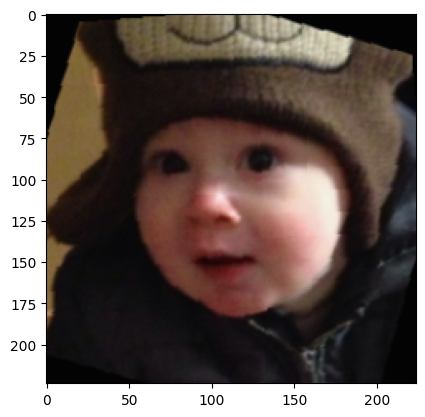

In [17]:
# show an image
image, label = train_dataset[1]
plt.imshow(image.permute(1, 2, 0))
plt.show()

In [18]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
# Define the labels and their mapping
labels = ["female", "male"]
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = i
    id2label[i] = label

### Train from scratch

In [ ]:
from torchvision.models import efficientnet_v2_s

# Load the model with random weights and set num_classes to 2
efficientnet_v2_s = efficientnet_v2_s(num_classes=2, weights=None)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
efficientnet_v2_s.to(device)

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  

In [ ]:
# Check the number of parameters
total_params = sum([param.numel() for param in efficientnet_v2_s.parameters()])
print(f'{total_params:,} total parameters.')

20,180,050 total parameters.


In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(efficientnet_v2_s.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  efficientnet_v2_s.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    outputs = efficientnet_v2_s(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  efficientnet_v2_s.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = efficientnet_v2_s(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(efficientnet_v2_s.state_dict(), 'efficientnet_v2_s.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 1.4804, Training Accuracy: 0.5152
Validation Loss: 1.6944, Validation Accuracy: 0.5250
===== Epoch 2 =====
Training Loss: 1.2023, Training Accuracy: 0.5092
Validation Loss: 1.4111, Validation Accuracy: 0.5000
===== Epoch 3 =====
Training Loss: 1.0915, Training Accuracy: 0.5096
Validation Loss: 1.2887, Validation Accuracy: 0.5360
===== Epoch 4 =====
Training Loss: 1.0073, Training Accuracy: 0.5120
Validation Loss: 2.3516, Validation Accuracy: 0.5190
===== Epoch 5 =====
Training Loss: 0.9096, Training Accuracy: 0.5144
Validation Loss: 2.7839, Validation Accuracy: 0.5060
===== Epoch 6 =====
Training Loss: 0.9129, Training Accuracy: 0.5131
Validation Loss: 1.2501, Validation Accuracy: 0.5570
===== Epoch 7 =====
Training Loss: 0.8697, Training Accuracy: 0.5367
Validation Loss: 2.1689, Validation Accuracy: 0.5710
===== Epoch 8 =====
Training Loss: 0.8941, Training Accuracy: 0.5389
Validation Loss: 1.1404, Validation Accuracy: 0.5620
===== Epoch 9 =====
Trai

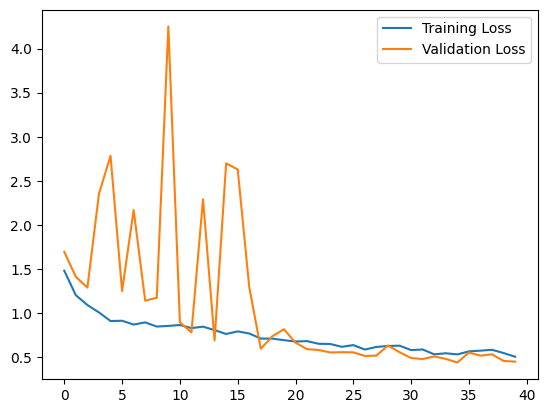

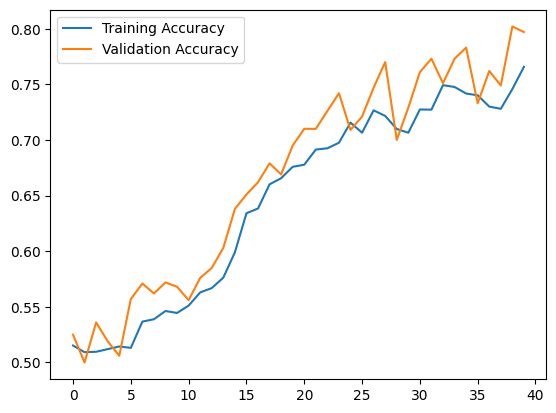

In [ ]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_23356\3476742938.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  efficientnet_v2_s.load_state_dict(torch.load('efficientnet_v


Accuracy: 0.8030

F1-Score: 0.8025

Precision: 0.8053

Recall: 0.8030


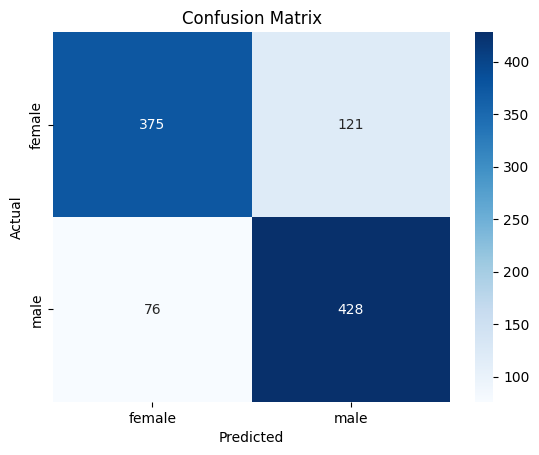

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
efficientnet_v2_s.load_state_dict(torch.load('efficientnet_v2_s.pth'))
efficientnet_v2_s.to(device)

efficientnet_v2_s.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = efficientnet_v2_s(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

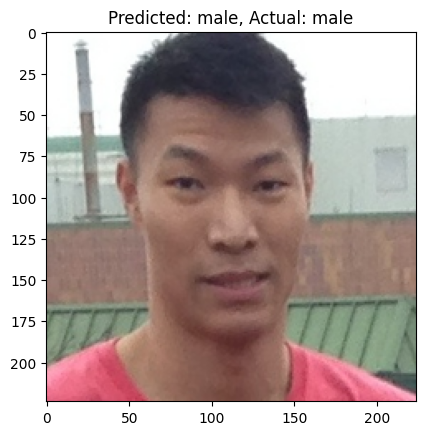

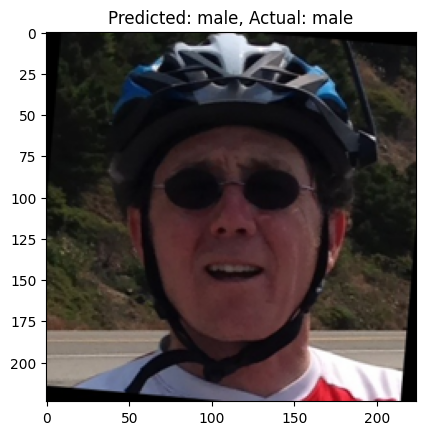

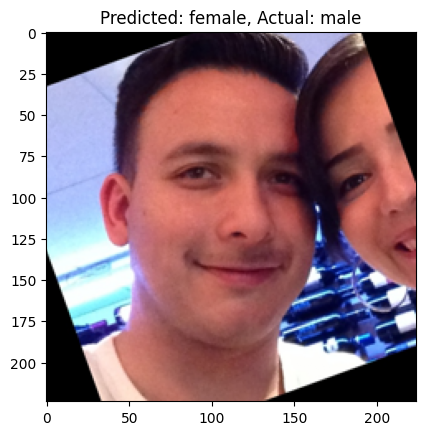

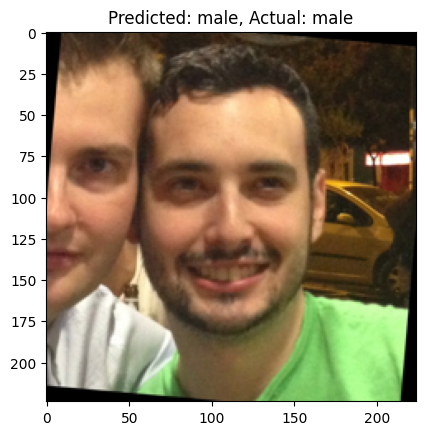

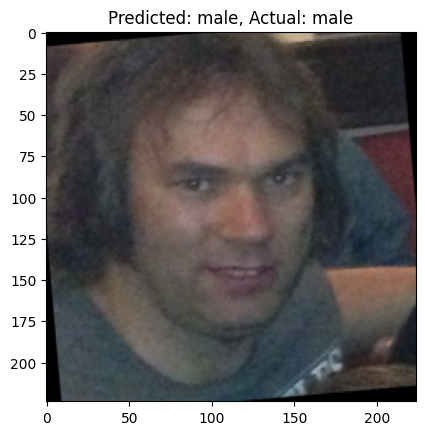

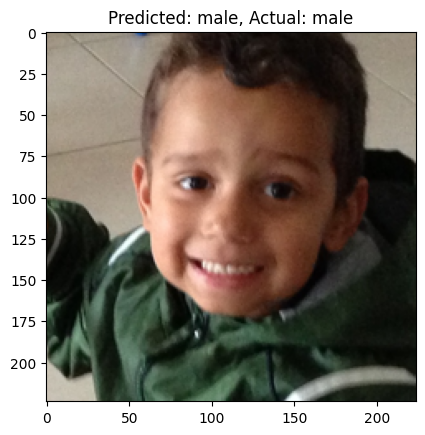

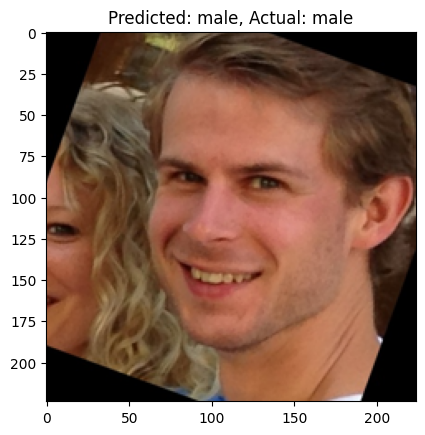

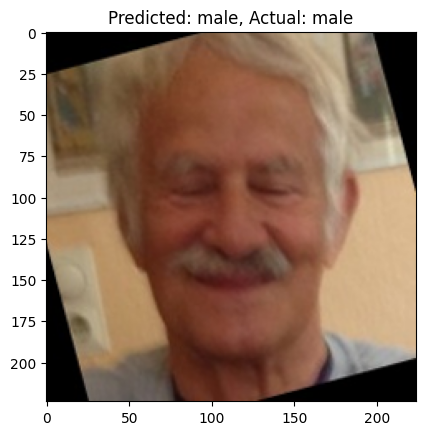

In [ ]:
# Show some predictions
efficientnet_v2_s.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = efficientnet_v2_s(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [ ]:
from torchvision.models import efficientnet_v2_s, EfficientNet_V2_S_Weights

# Load pretrained model
efficientnet_v2_s = efficientnet_v2_s(weights=EfficientNet_V2_S_Weights.IMAGENET1K_V1)
# Change the classifier to output 2 classes
efficientnet_v2_s.classifier[1] = torch.nn.Linear(efficientnet_v2_s.classifier[1].in_features, 2)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
efficientnet_v2_s.to(device)

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  

In [ ]:
# Check the number of parameters
total_params = sum([param.numel() for param in efficientnet_v2_s.parameters()])
print(f'{total_params:,} total parameters.')

20,180,050 total parameters.


In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(efficientnet_v2_s.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  efficientnet_v2_s.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    outputs = efficientnet_v2_s(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  efficientnet_v2_s.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = efficientnet_v2_s(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(efficientnet_v2_s.state_dict(), 'efficientnet_v2_s_finetune.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.2924, Training Accuracy: 0.8690
Validation Loss: 0.1281, Validation Accuracy: 0.9490
===== Epoch 2 =====
Training Loss: 0.1177, Training Accuracy: 0.9541
Validation Loss: 0.1021, Validation Accuracy: 0.9600
===== Epoch 3 =====
Training Loss: 0.0733, Training Accuracy: 0.9736
Validation Loss: 0.0840, Validation Accuracy: 0.9630
===== Epoch 4 =====
Training Loss: 0.0466, Training Accuracy: 0.9822
Validation Loss: 0.0746, Validation Accuracy: 0.9730
===== Epoch 5 =====
Training Loss: 0.0357, Training Accuracy: 0.9862
Validation Loss: 0.1179, Validation Accuracy: 0.9570
===== Epoch 6 =====
Training Loss: 0.0308, Training Accuracy: 0.9890
Validation Loss: 0.0674, Validation Accuracy: 0.9780
===== Epoch 7 =====
Training Loss: 0.0327, Training Accuracy: 0.9902
Validation Loss: 0.0768, Validation Accuracy: 0.9770
===== Epoch 8 =====
Training Loss: 0.0208, Training Accuracy: 0.9932
Validation Loss: 0.0851, Validation Accuracy: 0.9730
===== Epoch 9 =====
Trai

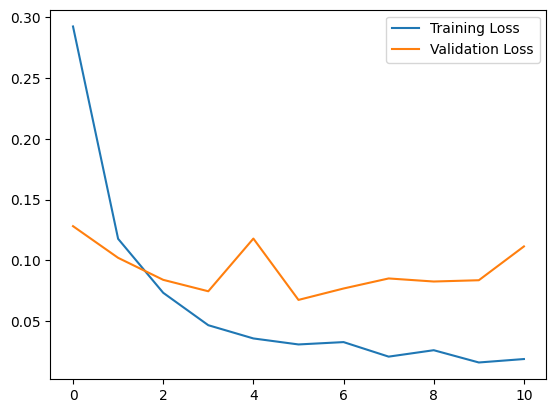

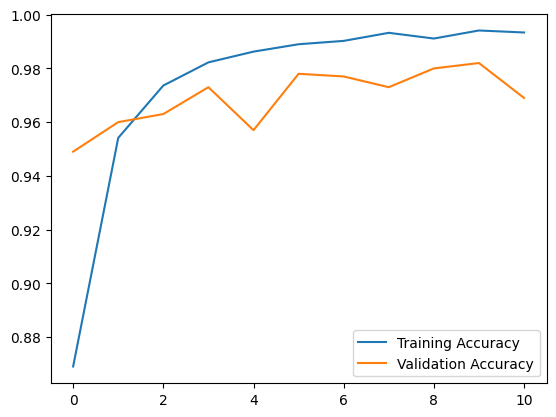

In [ ]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_25580\106709543.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  efficientnet_v2_s.load_state_dict(torch.load('efficientnet_v2


Accuracy: 0.9730

F1-Score: 0.9730

Precision: 0.9732

Recall: 0.9730


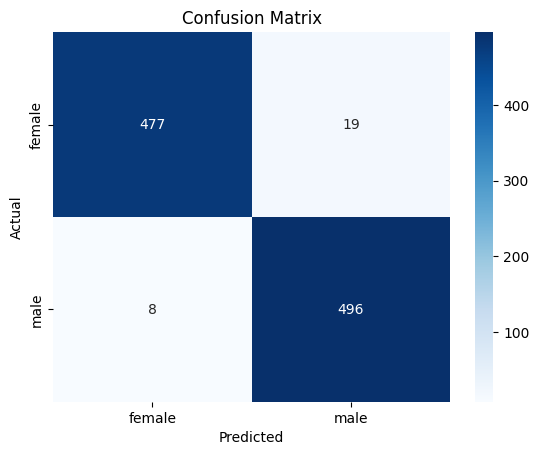

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
efficientnet_v2_s.load_state_dict(torch.load('efficientnet_v2_s_finetune.pth'))
efficientnet_v2_s.to(device)

efficientnet_v2_s.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = efficientnet_v2_s(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

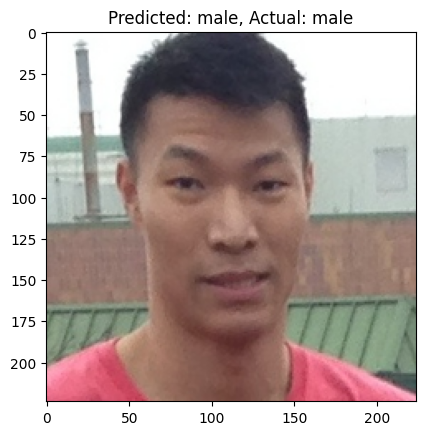

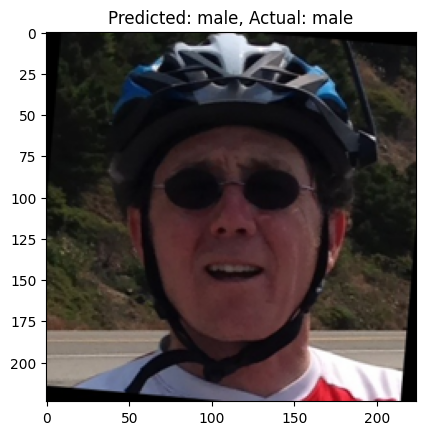

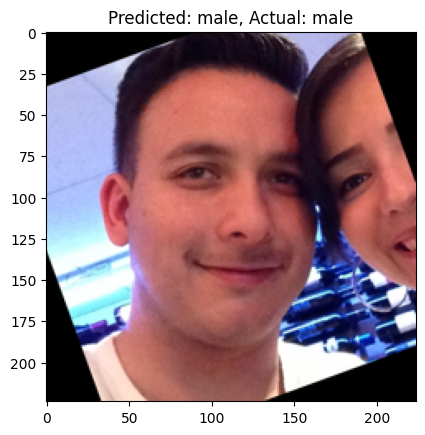

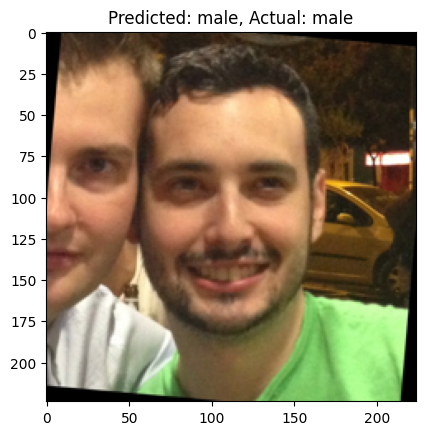

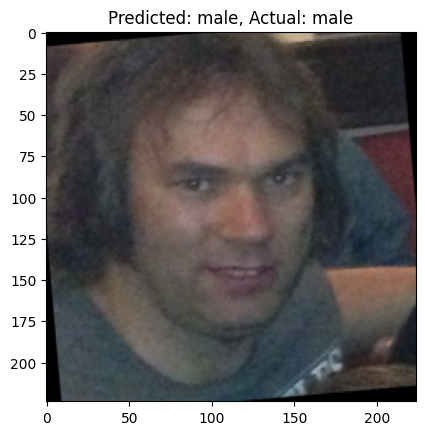

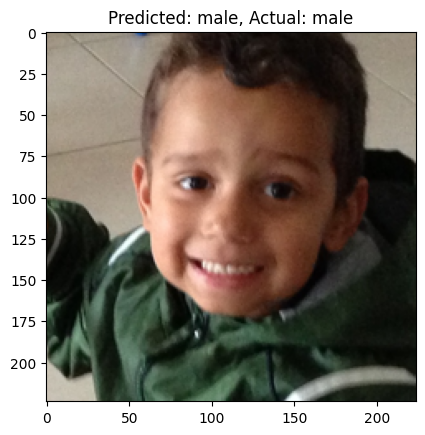

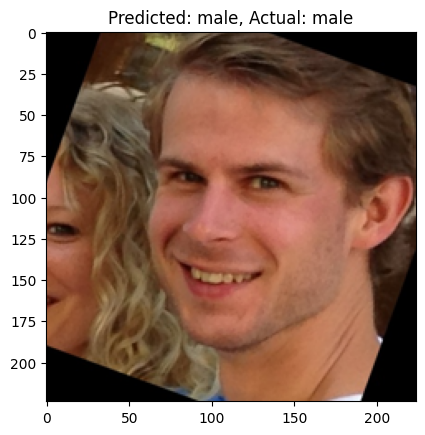

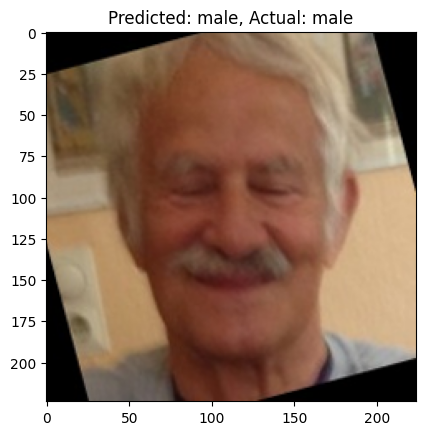

In [ ]:
# Show some predictions
efficientnet_v2_s.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = efficientnet_v2_s(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

## Less Training Data (4000 Train, 500 Val, Same 1000 Test data)

In [ ]:
# remove the 1000 test images from the dataset
df_filtered = df[~df['path'].isin(test_df['path'])].reset_index(drop=True)

# sample 4500 images, with an equal number of each gender for train set
df_male = df_filtered[df_filtered['gender'] == 'm'].sample(n=2250, random_state=23)
df_female = df_filtered[df_filtered['gender'] == 'f'].sample(n=2250, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    2250
f    2250
Name: count, dtype: int64


In [ ]:
# Get train and validation sets (4000-500)
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(df_sampled, test_size=500, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [ ]:
len(train_dataset), len(val_dataset), len(test_dataset)

(4000, 500, 1000)

In [ ]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

### Train from scratch

In [ ]:
from torchvision.models import efficientnet_v2_s

# Load the model with random weights and set num_classes to 2
efficientnet_v2_s = efficientnet_v2_s(num_classes=2, weights=None)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
efficientnet_v2_s.to(device)

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  

In [ ]:
# Check the number of parameters
total_params = sum([param.numel() for param in efficientnet_v2_s.parameters()])
print(f'{total_params:,} total parameters.')

20,180,050 total parameters.


In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(efficientnet_v2_s.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  efficientnet_v2_s.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    outputs = efficientnet_v2_s(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  efficientnet_v2_s.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = efficientnet_v2_s(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(efficientnet_v2_s.state_dict(), 'efficientnet_v2_s_s_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 1.5237, Training Accuracy: 0.5148
Validation Loss: 3.0431, Validation Accuracy: 0.5380
===== Epoch 2 =====
Training Loss: 1.3782, Training Accuracy: 0.5132
Validation Loss: 8.5703, Validation Accuracy: 0.4900
===== Epoch 3 =====
Training Loss: 1.2269, Training Accuracy: 0.5330
Validation Loss: 2.2658, Validation Accuracy: 0.5500
===== Epoch 4 =====
Training Loss: 1.1857, Training Accuracy: 0.5248
Validation Loss: 3.5172, Validation Accuracy: 0.5240
===== Epoch 5 =====
Training Loss: 1.2018, Training Accuracy: 0.5242
Validation Loss: 2.2789, Validation Accuracy: 0.5180
===== Epoch 6 =====
Training Loss: 1.2867, Training Accuracy: 0.5030
Validation Loss: 1.0468, Validation Accuracy: 0.5380
===== Epoch 7 =====
Training Loss: 1.0818, Training Accuracy: 0.5168
Validation Loss: 2.1984, Validation Accuracy: 0.5220
===== Epoch 8 =====
Training Loss: 1.0407, Training Accuracy: 0.5305
Validation Loss: 2.1711, Validation Accuracy: 0.5360
===== Epoch 9 =====
Trai

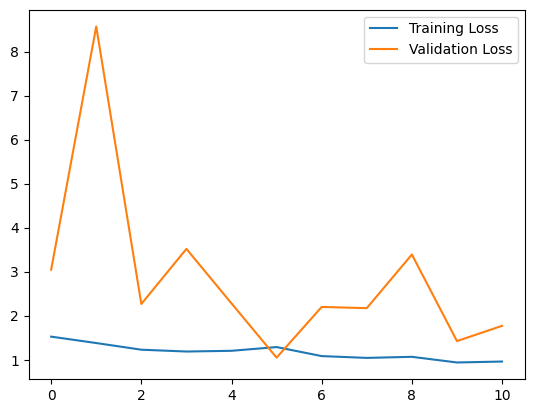

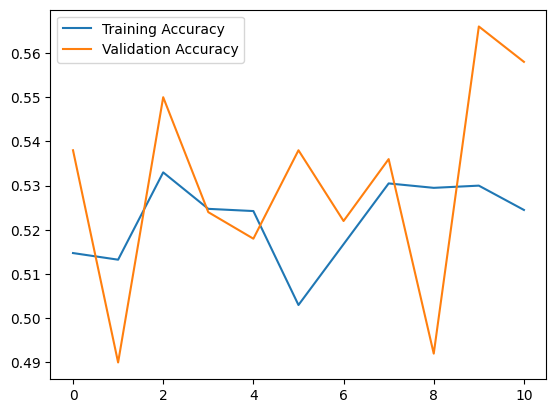

In [ ]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_18300\3134302240.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  efficientnet_v2_s.load_state_dict(torch.load('efficientnet_v


Accuracy: 0.5670

F1-Score: 0.5587

Precision: 0.5711

Recall: 0.5670


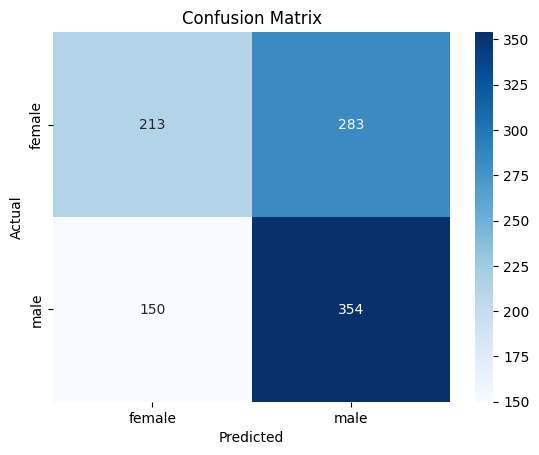

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
efficientnet_v2_s.load_state_dict(torch.load('efficientnet_v2_s_s_data.pth'))
efficientnet_v2_s.to(device)

efficientnet_v2_s.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = efficientnet_v2_s(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

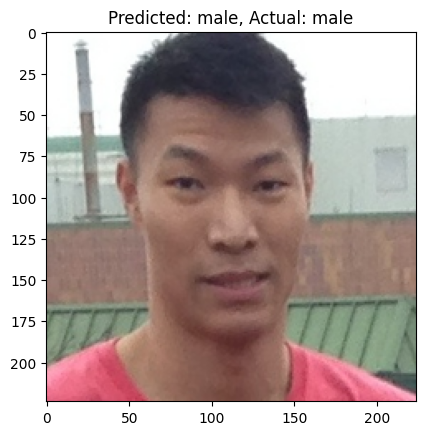

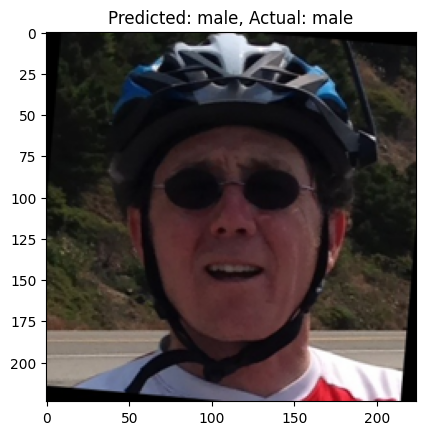

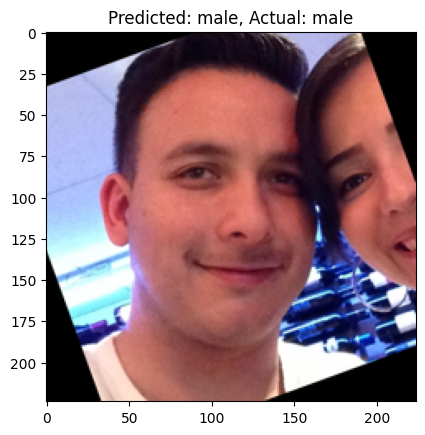

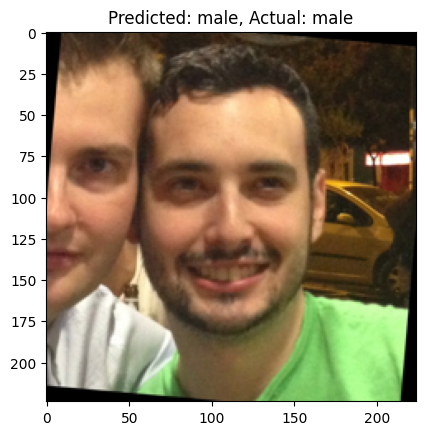

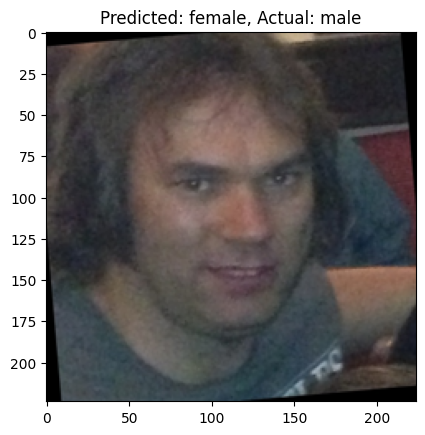

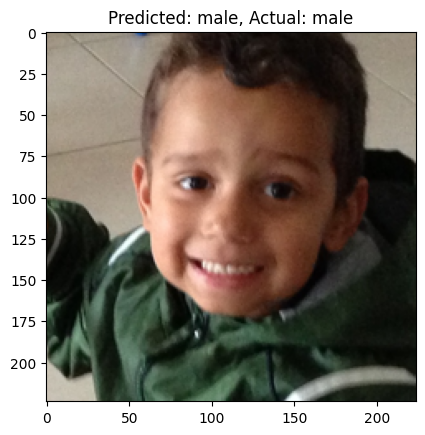

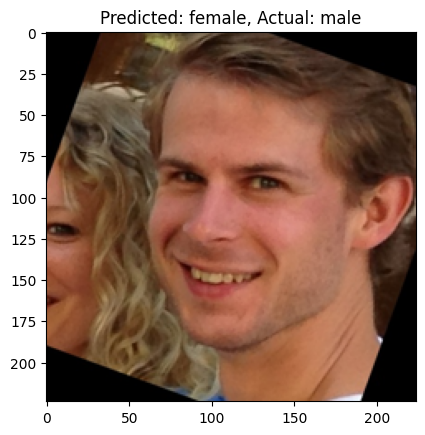

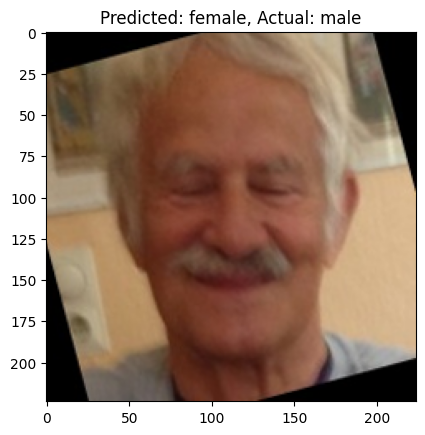

In [ ]:
# Show some predictions
efficientnet_v2_s.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = efficientnet_v2_s(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [ ]:
from torchvision.models import efficientnet_v2_s, EfficientNet_V2_S_Weights

# Load pretrained model
efficientnet_v2_s = efficientnet_v2_s(weights=EfficientNet_V2_S_Weights.IMAGENET1K_V1)
# Change the classifier to output 2 classes
efficientnet_v2_s.classifier[1] = torch.nn.Linear(efficientnet_v2_s.classifier[1].in_features, 2)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
efficientnet_v2_s.to(device)

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  

In [ ]:
# Check the number of parameters
total_params = sum([param.numel() for param in efficientnet_v2_s.parameters()])
print(f'{total_params:,} total parameters.')

20,180,050 total parameters.


In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(efficientnet_v2_s.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  efficientnet_v2_s.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    outputs = efficientnet_v2_s(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  efficientnet_v2_s.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = efficientnet_v2_s(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(efficientnet_v2_s.state_dict(), 'efficientnet_v2_s_finetune_s_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.3820, Training Accuracy: 0.8217
Validation Loss: 0.1940, Validation Accuracy: 0.9260
===== Epoch 2 =====
Training Loss: 0.1760, Training Accuracy: 0.9333
Validation Loss: 0.1560, Validation Accuracy: 0.9400
===== Epoch 3 =====
Training Loss: 0.1101, Training Accuracy: 0.9583
Validation Loss: 0.2085, Validation Accuracy: 0.9240
===== Epoch 4 =====
Training Loss: 0.0731, Training Accuracy: 0.9742
Validation Loss: 0.1270, Validation Accuracy: 0.9460
===== Epoch 5 =====
Training Loss: 0.0588, Training Accuracy: 0.9775
Validation Loss: 0.1949, Validation Accuracy: 0.9300
===== Epoch 6 =====
Training Loss: 0.0442, Training Accuracy: 0.9838
Validation Loss: 0.2152, Validation Accuracy: 0.9380
===== Epoch 7 =====
Training Loss: 0.0281, Training Accuracy: 0.9895
Validation Loss: 0.1447, Validation Accuracy: 0.9560
===== Epoch 8 =====
Training Loss: 0.0309, Training Accuracy: 0.9900
Validation Loss: 0.1363, Validation Accuracy: 0.9580
===== Epoch 9 =====
Trai

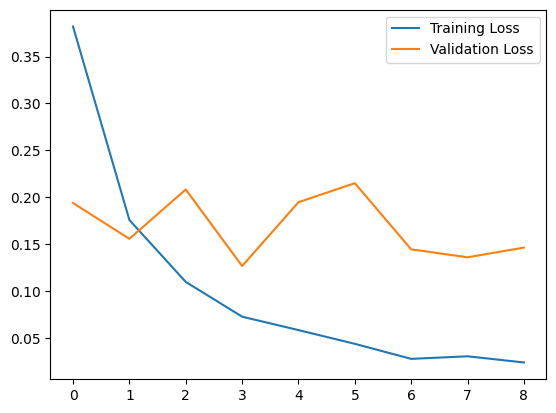

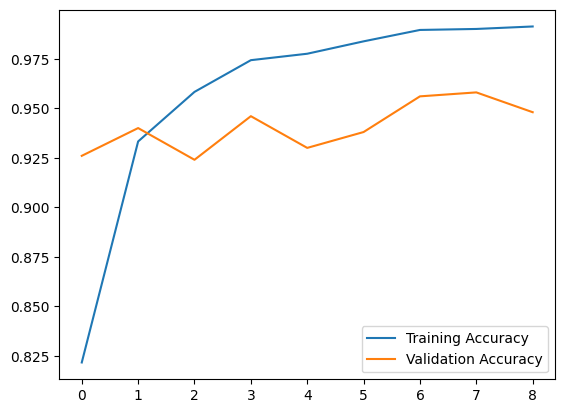

In [ ]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_20132\4063619694.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  efficientnet_v2_s.load_state_dict(torch.load('efficientnet_v


Accuracy: 0.9600

F1-Score: 0.9600

Precision: 0.9606

Recall: 0.9600


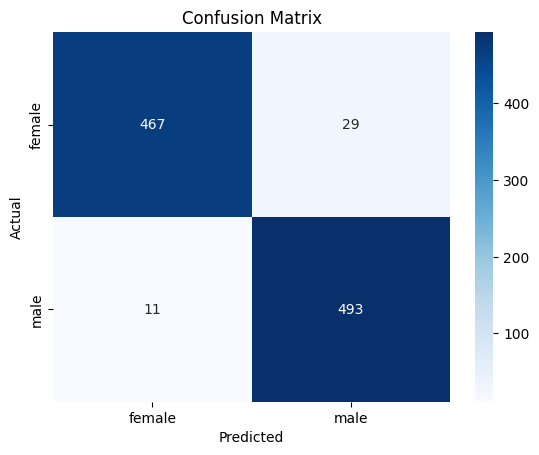

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
efficientnet_v2_s.load_state_dict(torch.load('efficientnet_v2_s_finetune_s_data.pth'))
efficientnet_v2_s.to(device)

efficientnet_v2_s.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = efficientnet_v2_s(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

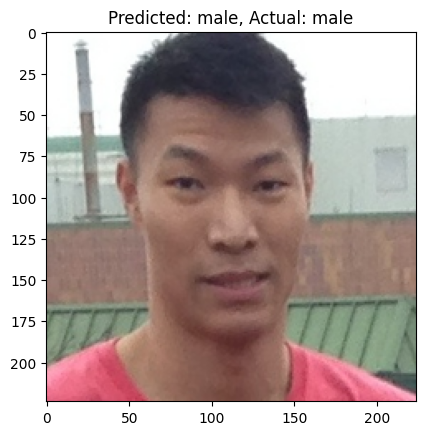

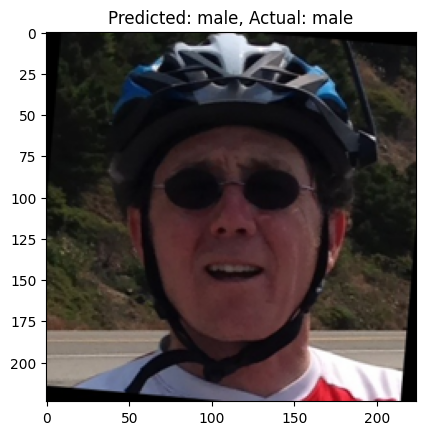

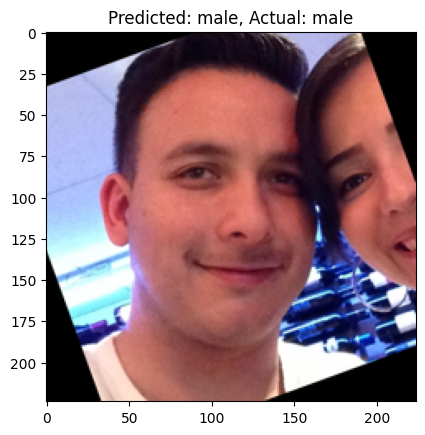

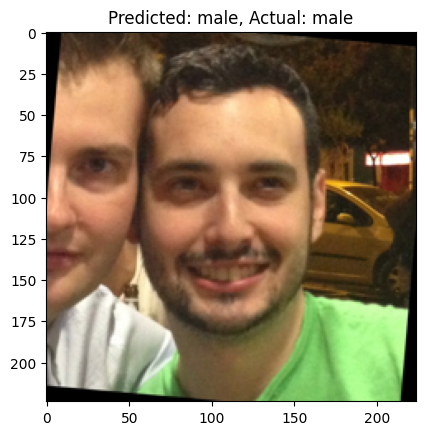

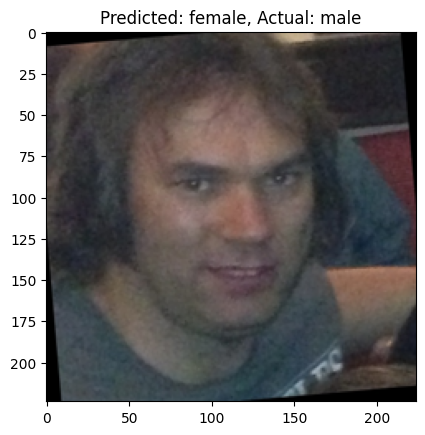

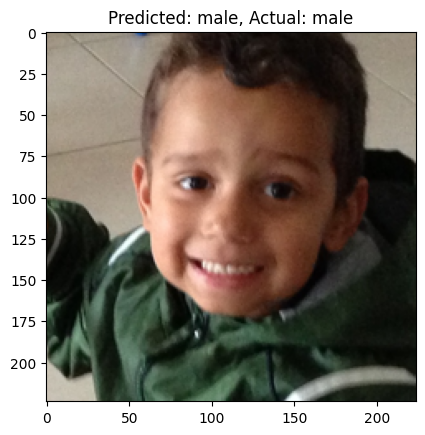

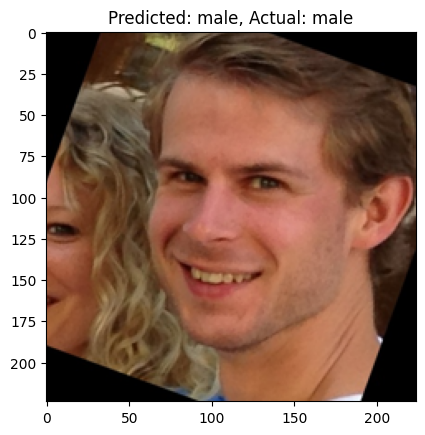

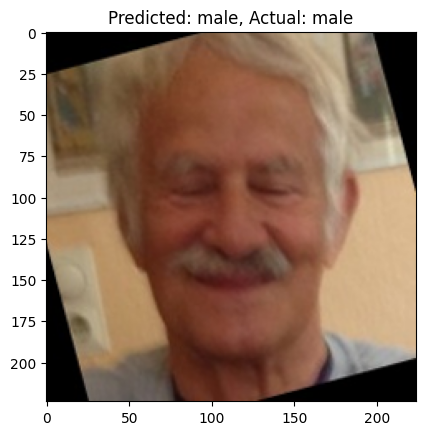

In [ ]:
# Show some predictions
efficientnet_v2_s.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = efficientnet_v2_s(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

## More Training Data (12000 Train, 1500 Val, Same 1000 Test data)

In [20]:
# remove the 1000 test images from the dataset
df_filtered = df[~df['path'].isin(test_df['path'])].reset_index(drop=True)

# sample 13500 images, with an equal number of each gender for train set
df_male = df_filtered[df_filtered['gender'] == 'm'].sample(n=6750, random_state=23)
df_female = df_filtered[df_filtered['gender'] == 'f'].sample(n=6750, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    6750
f    6750
Name: count, dtype: int64


In [21]:
# Get train and validation sets (12000-1500)
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(df_sampled, test_size=1500, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [22]:
len(train_dataset), len(val_dataset), len(test_dataset)

(12000, 1500, 1000)

In [23]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

### Train from scratch

In [ ]:
from torchvision.models import efficientnet_v2_s

# Load the model with random weights and set num_classes to 2
efficientnet_v2_s = efficientnet_v2_s(num_classes=2, weights=None)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
efficientnet_v2_s.to(device)

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  

In [ ]:
# Check the number of parameters
total_params = sum([param.numel() for param in efficientnet_v2_s.parameters()])
print(f'{total_params:,} total parameters.')

20,180,050 total parameters.


In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(efficientnet_v2_s.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  efficientnet_v2_s.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    outputs = efficientnet_v2_s(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  efficientnet_v2_s.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = efficientnet_v2_s(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(efficientnet_v2_s.state_dict(), 'efficientnet_v2_s_l_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 1.3736, Training Accuracy: 0.5044
Validation Loss: 1.0253, Validation Accuracy: 0.5460
===== Epoch 2 =====
Training Loss: 1.1113, Training Accuracy: 0.5064
Validation Loss: 0.7061, Validation Accuracy: 0.5687
===== Epoch 3 =====
Training Loss: 0.9751, Training Accuracy: 0.5103
Validation Loss: 0.9771, Validation Accuracy: 0.5533
===== Epoch 4 =====
Training Loss: 0.8941, Training Accuracy: 0.5188
Validation Loss: 0.9334, Validation Accuracy: 0.5853
===== Epoch 5 =====
Training Loss: 0.8808, Training Accuracy: 0.5282
Validation Loss: 0.8436, Validation Accuracy: 0.5620
===== Epoch 6 =====
Training Loss: 0.8660, Training Accuracy: 0.5363
Validation Loss: 0.7024, Validation Accuracy: 0.5767
===== Epoch 7 =====
Training Loss: 0.8472, Training Accuracy: 0.5454
Validation Loss: 0.7412, Validation Accuracy: 0.5460
===== Epoch 8 =====
Training Loss: 0.7933, Training Accuracy: 0.5730
Validation Loss: 0.8949, Validation Accuracy: 0.6347
===== Epoch 9 =====
Trai

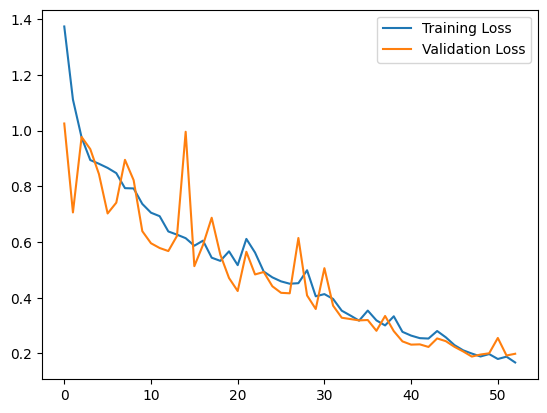

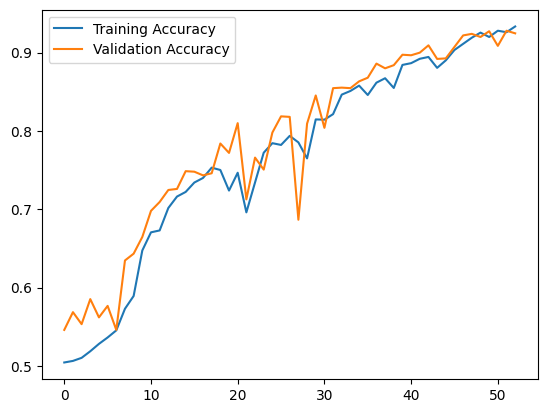

In [ ]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_11708\3297654494.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  efficientnet_v2_s.load_state_dict(torch.load('efficientnet_v


Accuracy: 0.9280

F1-Score: 0.9280

Precision: 0.9285

Recall: 0.9280


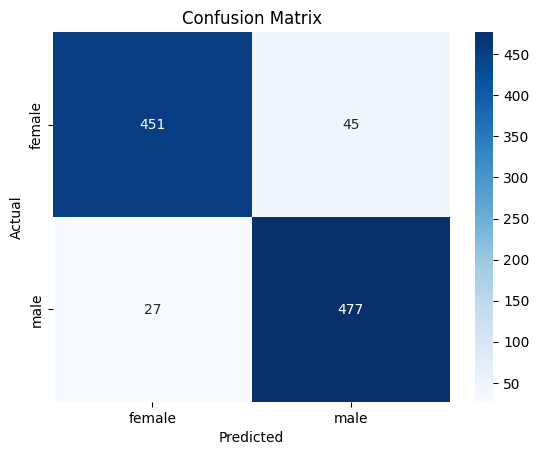

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
efficientnet_v2_s.load_state_dict(torch.load('efficientnet_v2_s_l_data.pth'))
efficientnet_v2_s.to(device)

efficientnet_v2_s.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = efficientnet_v2_s(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

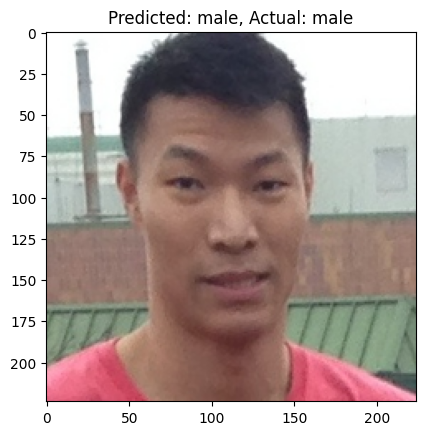

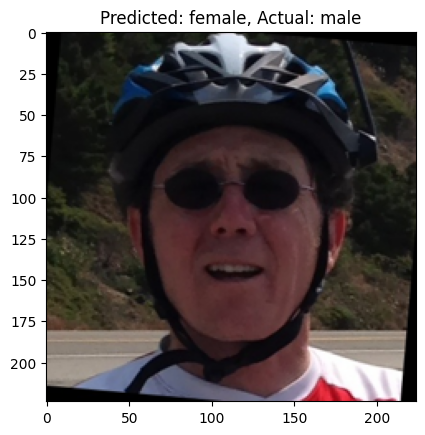

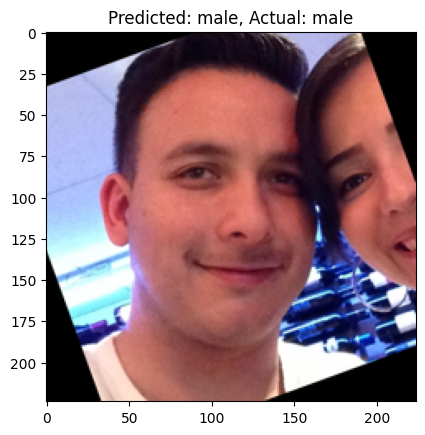

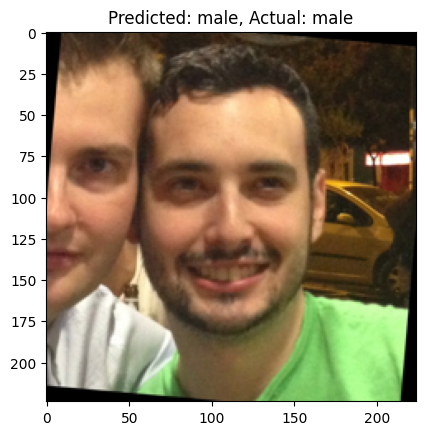

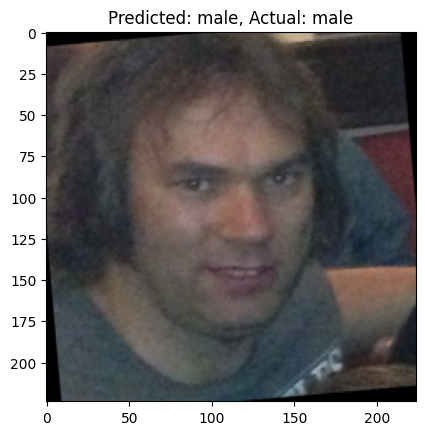

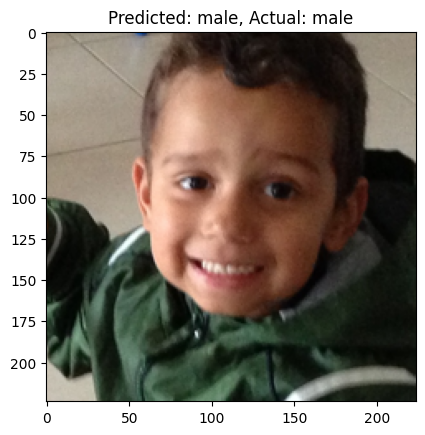

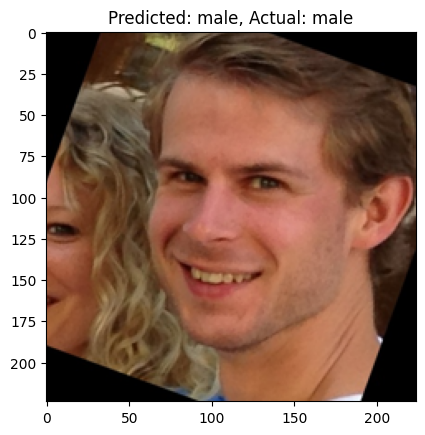

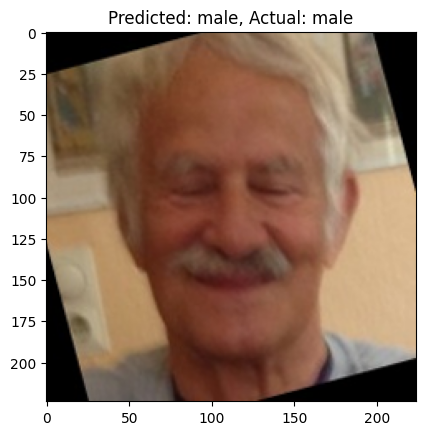

In [ ]:
# Show some predictions
efficientnet_v2_s.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = efficientnet_v2_s(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [ ]:
from torchvision.models import efficientnet_v2_s, EfficientNet_V2_S_Weights

# Load pretrained model
efficientnet_v2_s = efficientnet_v2_s(weights=EfficientNet_V2_S_Weights.IMAGENET1K_V1)
# Change the classifier to output 2 classes
efficientnet_v2_s.classifier[1] = torch.nn.Linear(efficientnet_v2_s.classifier[1].in_features, 2)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
efficientnet_v2_s.to(device)

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  

In [ ]:
# Check the number of parameters
total_params = sum([param.numel() for param in efficientnet_v2_s.parameters()])
print(f'{total_params:,} total parameters.')

20,180,050 total parameters.


In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(efficientnet_v2_s.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  efficientnet_v2_s.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    outputs = efficientnet_v2_s(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  efficientnet_v2_s.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = efficientnet_v2_s(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(efficientnet_v2_s.state_dict(), 'efficientnet_v2_s_finetune_l_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.2677, Training Accuracy: 0.8788
Validation Loss: 0.1010, Validation Accuracy: 0.9613
===== Epoch 2 =====
Training Loss: 0.1088, Training Accuracy: 0.9582
Validation Loss: 0.0945, Validation Accuracy: 0.9653
===== Epoch 3 =====
Training Loss: 0.0707, Training Accuracy: 0.9740
Validation Loss: 0.0825, Validation Accuracy: 0.9713
===== Epoch 4 =====
Training Loss: 0.0447, Training Accuracy: 0.9848
Validation Loss: 0.0925, Validation Accuracy: 0.9620
===== Epoch 5 =====
Training Loss: 0.0397, Training Accuracy: 0.9858
Validation Loss: 0.0700, Validation Accuracy: 0.9767
===== Epoch 6 =====
Training Loss: 0.0277, Training Accuracy: 0.9906
Validation Loss: 0.0662, Validation Accuracy: 0.9800
===== Epoch 7 =====
Training Loss: 0.0221, Training Accuracy: 0.9918
Validation Loss: 0.0889, Validation Accuracy: 0.9760
===== Epoch 8 =====
Training Loss: 0.0247, Training Accuracy: 0.9911
Validation Loss: 0.0616, Validation Accuracy: 0.9800
===== Epoch 9 =====
Trai

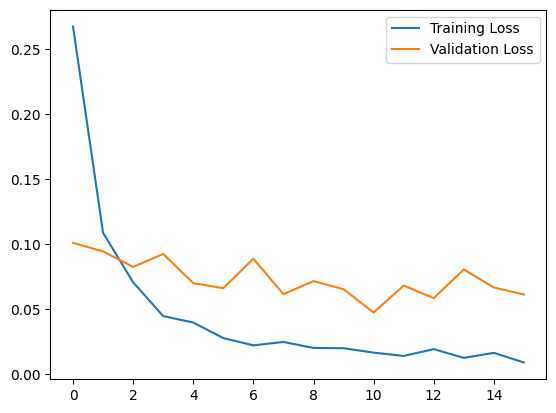

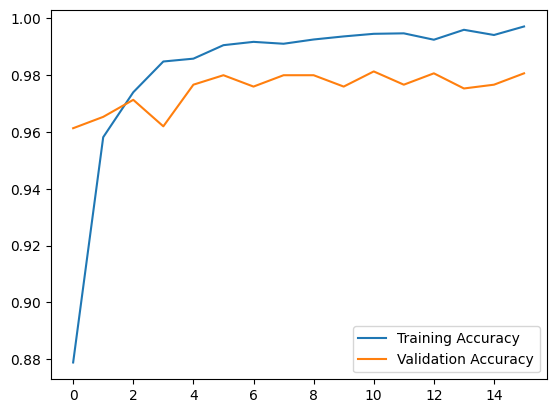

In [ ]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_21656\819122331.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  efficientnet_v2_s.load_state_dict(torch.load('efficientnet_v2


Accuracy: 0.9800

F1-Score: 0.9800

Precision: 0.9800

Recall: 0.9800


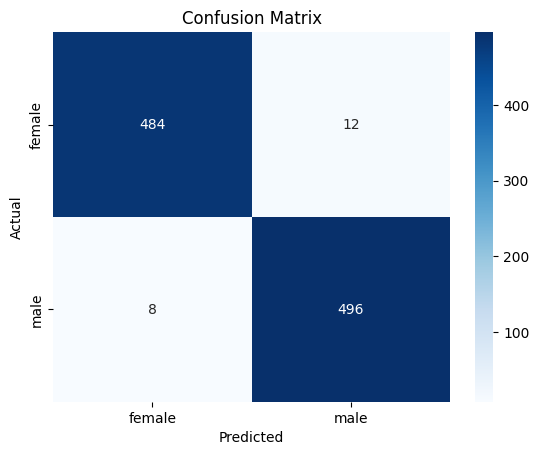

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
efficientnet_v2_s.load_state_dict(torch.load('efficientnet_v2_s_finetune_l_data.pth'))
efficientnet_v2_s.to(device)

efficientnet_v2_s.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = efficientnet_v2_s(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

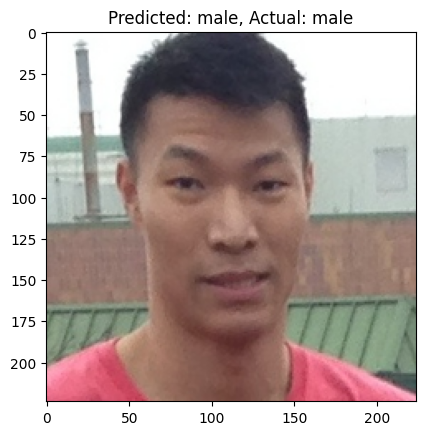

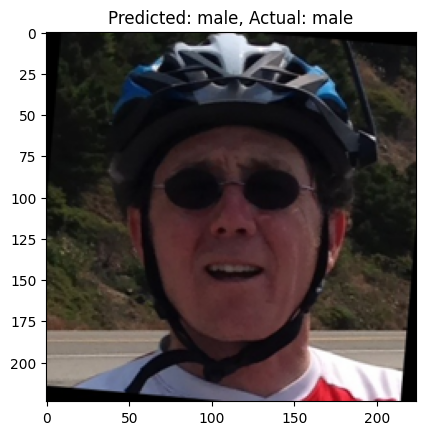

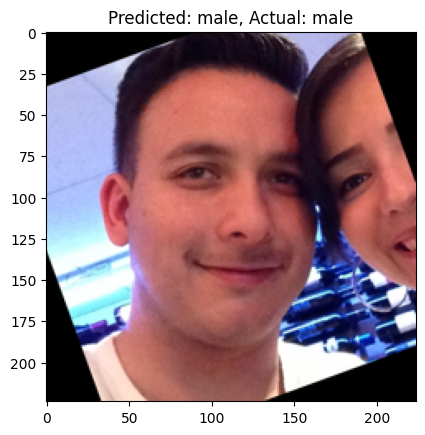

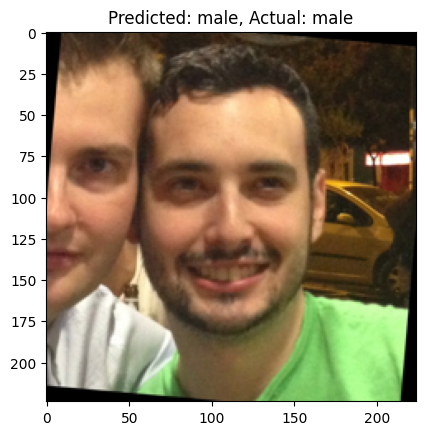

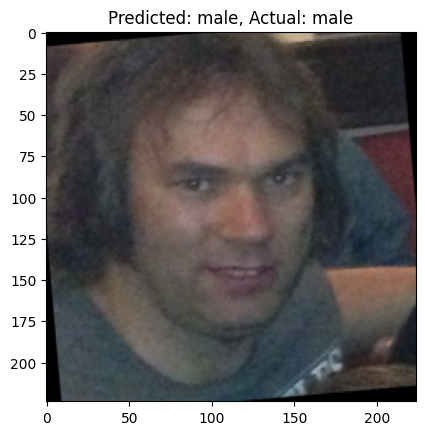

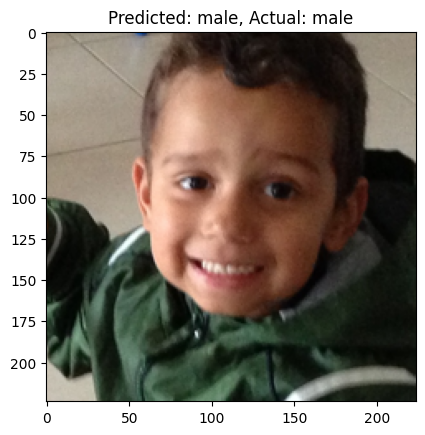

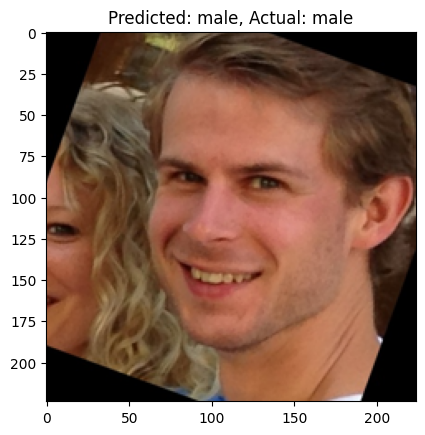

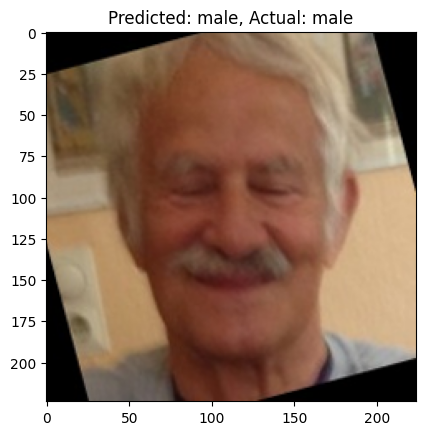

In [ ]:
# Show some predictions
efficientnet_v2_s.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = efficientnet_v2_s(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()